In [1]:
using  Colors, Images, FileIO, FixedPointNumbers, Plots

Problem 1

In [2]:
function filter_RGB(rgb::RGB{N0f8}, filter::RGB)
    return RGB{N0f8}(rgb.r * filter.r, rgb.g * filter.g, rgb.b*filter.b)
end

function filter_RGB(rgb::RGB{N0f8}, hsv_value_spec::HSV)
    rgb_v = convert(RGB{N0f8},hsv_value_spec)
    return filter_RGB(rgb, rgb_v)
end

function filter_RGB(rgb::RGB{N0f8},color_s::String)
    if(haskey(Colors.color_names ,color_s))
        r,g,b = Colors.color_names[color_s]
        rw = r / 255.0
        bw = b / 255.0
        gw = g / 255.0
        return RGB{N0f8}(rgb.r * rw, rgb.g *gw, rgb.b*bw)
    end
end

filter_RGB (generic function with 3 methods)

In [3]:
Colors.color_names["gold"]

(255, 215, 0)

In [4]:
# this works
#hsv1 = convert(HSV,RGB{N0f8}(1,1,1))
convert(RGB{N0f8},HSV(0, 0, 1))


In [5]:
img = load("./barbara_color.png");

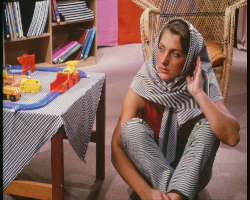

In [6]:
img

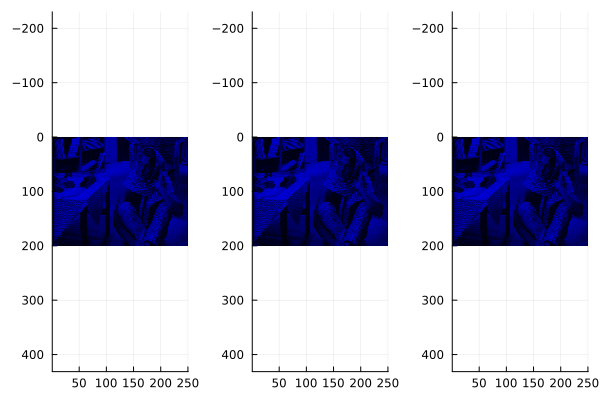

In [7]:

plot(plot(filter_RGB.(img, RGB(0,0,1))),plot(filter_RGB.(img, convert(HSV,RGB(0,0,1)))),plot(filter_RGB.(img,"blue")),layout=(1,3))

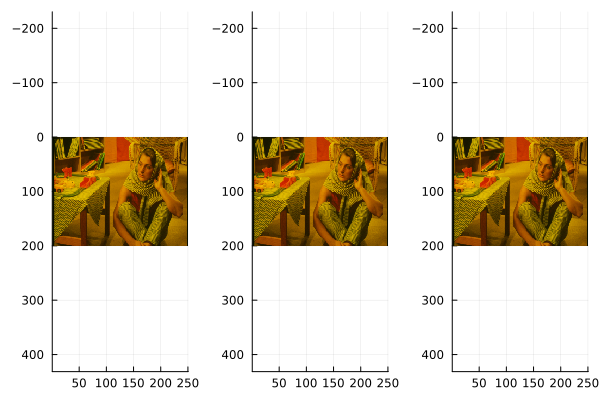

In [8]:
r,g,b = Colors.color_names["gold"]
rgb = RGB(r/255, g/255, b/255)

plot(plot(filter_RGB.(img,rgb)),plot(filter_RGB.(img, convert(HSV,rgb))),plot(filter_RGB.(img,"gold")),layout=(1,3))

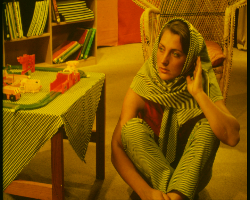

In [9]:
typeof(Colors.color_names)
haskey(Colors.color_names,"blue")
filter_RGB.(img, "gold")

Problem 1.2 

In [10]:
function grayToColor(redPercent::Float64,bluePercent::Float64,greenPercent::Float64, image::Matrix{Gray{N0f8}})
    if(redPercent+bluePercent+greenPercent > 1.0)
        print("RGB percents are greater than 1")
        return
    end

    return RGB_filter.(image,redPercent,greenPercent,bluePercent)
end

function RGB_filter(rgb::Gray{N0f8}, r = 1.0, g = 1.0, b = 1.0)
    RGB{N0f8}(r * rgb, g * rgb, b * rgb)
end

RGB_filter (generic function with 4 methods)

In [150]:
function generateColorCurve(interval::Float64,phase_expand::Float64 = 1.0, phase_shift::Float64 = 0.0)
    values = [abs(sin(angle*2pi*phase_expand)-phase_shift) for angle in 0:interval:1]
    return values
end

function grayToRgb(grayPixel,rArray,gArray,bArray)
    digits = count(x->x=='0',string(length(rArray)-1))
    a = Gray.(convert.(Normed{UInt8,8}, grayPixel));
    rounded_grayValue = round(Float32.(a), digits=digits)
    index = convert(UInt32,round(rounded_grayValue*(length(rArray))-1))
    rValue = rArray[index]
    gValue = gArray[index]
    bValue = bArray[index]
    if rValue >1.0
        rValue = 1.0
    end
    if gValue >1.0
        gValue = 1.0
    end
    if bValue >1.0
        bValue = 1.0
    end
    #print("$rValue $gValue $bValue")
    return RGB{N0f8}(rValue,gValue,bValue)
end

grayToRgb (generic function with 1 method)

In [151]:
interval = 0.00001
y = generateColorCurve(interval,.25,0.0)
x = [angle for angle in 0:interval:1]

100001-element Vector{Float64}:
 0.0
 1.0e-5
 2.0e-5
 3.0e-5
 4.0e-5
 5.0e-5
 6.0e-5
 7.0e-5
 8.0e-5
 9.0e-5
 ⋮
 0.99992
 0.99993
 0.99994
 0.99995
 0.99996
 0.99997
 0.99998
 0.99999
 1.0

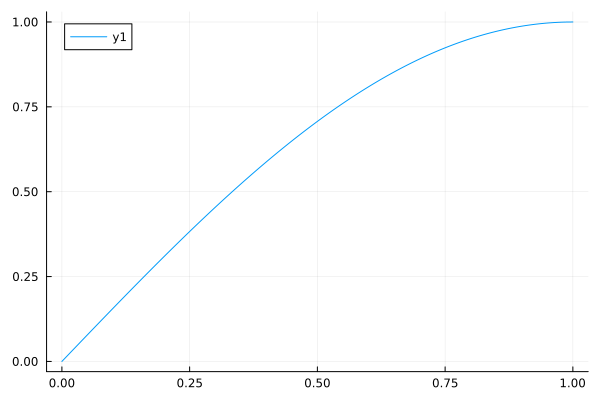

In [152]:
plot(x,y)

In [47]:
gray_image = load("./lena_gray.png");

1001-element Vector{Float64}:
 0.0
 0.006283143965558951
 0.012566039883352607
 0.018848439715408175
 0.02513009544333748
 0.03141075907812829
 0.03769018266993454
 0.0439681183178649
 0.050244318179769556
 0.05651853448202452
 ⋮
 0.05024431817977022
 0.043968118317865075
 0.0376901826699351
 0.03141075907812836
 0.025130095443337937
 0.018848439715408137
 0.01256603988335296
 0.006283143965558805
 2.4492935982947064e-16

In [153]:
gray_image = load("./cameraman_gray.png");
red_curve = generateColorCurve(interval,.8,0.0)
blue_curve = generateColorCurve(interval,0.5,-0.1)
green_curve = generateColorCurve(interval,0.2,0.3)

100001-element Vector{Float64}:
 0.3
 0.29998743362938596
 0.2999748672587739
 0.29996230088816583
 0.29994973451756374
 0.2999371681469695
 0.29992460177638525
 0.2999120354058129
 0.29989946903525444
 0.29988690266471185
 ⋮
 0.6510254457126718
 0.6510293300611183
 0.6510332142593842
 0.6510370983074689
 0.6510409822053718
 0.6510448659530923
 0.6510487495506299
 0.6510526329979838
 0.6510565162951536

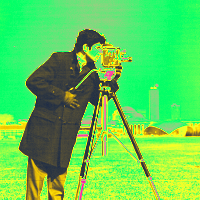

In [154]:
#color_iamge = grayscale_to_color(gray_image,color_mapping)
grayToRgb.(gray_image, Ref(red_curve),Ref(blue_curve),Ref(green_curve))

In [157]:
gray_image = load("./lena_gray.png")
red_curve = generateColorCurve(interval,.3,0.0)
blue_curve = generateColorCurve(interval,0.5,0.0)
green_curve = generateColorCurve(interval,0.6,0.3)

100001-element Vector{Float64}:
 0.3
 0.29996230088816583
 0.29992460177638525
 0.29988690266471185
 0.29984920355319916
 0.2998115044419008
 0.29977380533087034
 0.2997361062201614
 0.2996984071098274
 0.2996607079999221
 ⋮
 0.8875412317869749
 0.8875717372732121
 0.8876022419243792
 0.8876327457404323
 0.8876632487213281
 0.8876937508670233
 0.8877242521774746
 0.8877547526526395
 0.887785252292473

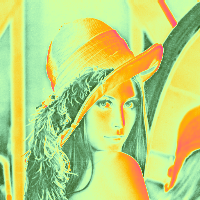

In [158]:
grayToRgb.(gray_image, Ref(red_curve),Ref(blue_curve),Ref(green_curve))

Problem 2

In [26]:
using Colors, ColorSchemes, ColorSchemeTools, Images, FileIO, FixedPointNumbers, Plots

In [27]:
colorschemes[:vangogh].notes

"from artist Vincent Van Gogh's painting The Starry Night, painted in June, 1889, depicting the view from the east-facing window of his asylum room at Saint-Rémy-de-Provence."

In [28]:
stary_night_scheme = colorschemes[:vangogh]

In [29]:
starry_night_extract = extract("starry_night_full.jpg", 30, 50, 0.01)

In [30]:
function compare_colors(color1, color2)
    r1, g1, b1 = red(color1), green(color1), blue(color1)
    r2, g2, b2 = red(color2), green(color2), blue(color2)
    if(r1+g1+b1 > r2+g2+b2)
        return true
    end
    return false
end

compare_colors (generic function with 1 method)

In [31]:
typeof(starry_night_extract)

ColorScheme{Vector{RGB{Float64}}, String, String}

In [32]:
sorted_sn_scheme = sort(stary_night_scheme.colors,lt=compare_colors)


In [33]:
sorted_sn_extract = sort(starry_night_extract.colors,lt=compare_colors)

In [34]:
for color in sorted_sn_scheme
    best = 999.99
    closest_color = nothing
    values = (0,0,0)
    r1, g1, b1 = red(color), green(color), blue(color)
    for color2 in sorted_sn_extract
        r2, g2, b2 = red(color2), green(color2), blue(color2)
        rd = abs(r1-r2)
        gd = abs(g1-g2)
        bd = abs(b1-b2)
        if(rd+gd+bd < best)
            best = rd+gd+bd
            closest_color = color2
            values = (rd,gd,bd)
        end
    end
    println("$color : $closest_color : diff $best : rgb $values")
end

RGB{Float64}(0.9493538255802926,0.9788824950318931,0.8911107310285581) : RGB{Float64}(0.7210421844794255,0.7568437586302339,0.7049080019331257) : diff 0.6365531065979586 : rgb (0.2283116411008671, 0.22203873640165916, 0.18620272909543234)
RGB{Float64}(0.959731486940972,0.9627244597914443,0.7235686748215752) : RGB{Float64}(0.7210421844794255,0.7568437586302339,0.7049080019331257) : diff 0.4632306765112063 : rgb (0.23868930246154652, 0.20588070116121038, 0.018660672888449414)
RGB{Float64}(0.7105809231208425,0.919514337453825,0.9261193665689855) : RGB{Float64}(0.7210421844794255,0.7568437586302339,0.7049080019331257) : diff 0.39434320481803387 : rgb (0.01046126135858294, 0.16267057882359115, 0.22121136463585978)
RGB{Float64}(0.9515717841286133,0.9260476308866568,0.5531104604358869) : RGB{Float64}(0.7461818834034941,0.7388717002645688,0.5091204335376687) : diff 0.4365558582454253 : rgb (0.2053899007251192, 0.18717593062208793, 0.04399002689821818)
RGB{Float64}(0.7692885597283127,0.83624721

In [35]:
for i in 1:length(sorted_sn_scheme)
    best = 999.99
    values = (0,0,0)
    r1, g1, b1 = red(sorted_sn_scheme[i]), green(sorted_sn_scheme[i]), blue(sorted_sn_scheme[i])
    r2, g2, b2 = red(sorted_sn_extract[i]), green(sorted_sn_extract[i]), blue(sorted_sn_extract[i])
    rd = abs(r1-r2)
    gd = abs(g1-g2)
    bd = abs(b1-b2)
    if(rd+gd+bd < best)
        best = rd+gd+bd
        values = (rd,gd,bd)
    end
    println("index $i : diff $best : rgb $values")
end

index 1 : diff 0.6365531065979586 : rgb (0.2283116411008671, 0.22203873640165916, 0.18620272909543234)
index 2 : diff 0.6518506043482598 : rgb (0.21354960353747787, 0.22385275952687544, 0.2144482412839065)
index 3 : diff 0.5994838072603916 : rgb (0.06965524786296595, 0.22640491052684308, 0.3034236488705826)
index 4 : diff 0.8633748978167799 : rgb (0.39712902141518847, 0.2871956545677413, 0.1790502218338501)
index 5 : diff 0.4793932261916042 : rgb (0.20634636940847995, 0.20890735175186403, 0.0641395050312602)
index 6 : diff 0.5438613580176822 : rgb (0.0006195425625131756, 0.24478181506044916, 0.29846000039471987)
index 7 : diff 0.6188728132585934 : rgb (0.31028947982091837, 0.2363352798451226, 0.07224805359255249)
index 8 : diff 0.4316625622999661 : rgb (0.13769417605786177, 0.22241926443893378, 0.07154912180317052)
index 9 : diff 0.6447129517473889 : rgb (0.1490654877752577, 0.13021388717331028, 0.3654335767988208)
index 10 : diff 0.3592628751042329 : rgb (0.036412245833536194, 0.10657

2.3

In [36]:
function mandelbrot(x, y)
    z = c = x + y*im
    for i in 1:100.0 
        abs(z) > 2 && return i 
        z = z^2 + c; 
    end; 
    0
end

mandelbrot (generic function with 1 method)

In [37]:
x = LinRange(-1.5, -1, 1000)
y = LinRange(-.5, .5, 1000)
matrix = mandelbrot.(x, y');

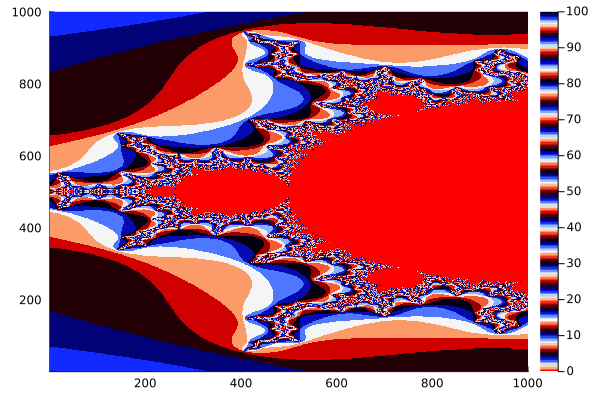

In [38]:
Plots.heatmap(1:size(matrix,2),1:size(matrix,1), matrix', 
    color = :flag)

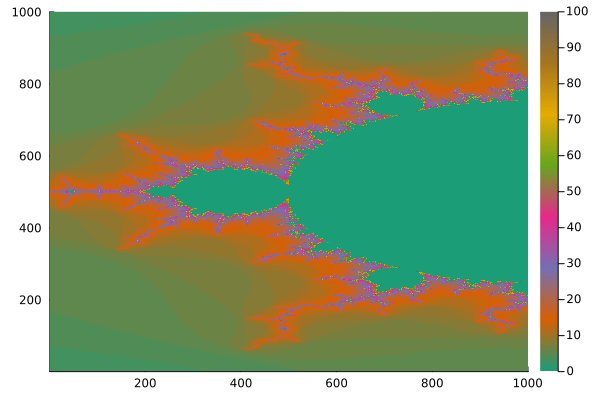

In [39]:
Plots.heatmap(1:size(matrix,2),1:size(matrix,1), matrix', color =:Dark2_8)

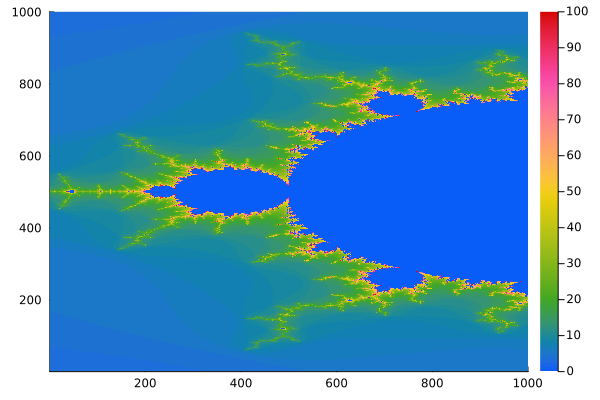

In [40]:
Plots.heatmap(1:size(matrix,2),1:size(matrix,1), matrix', color =:diverging_rainbow_bgymr_45_85_c67_n256)